In [1]:
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import os
import numpy as np
import tensorflow as tf
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout, Conv2D, MaxPooling2D, Flatten
from tensorflow.keras.optimizers import SGD, RMSprop
from keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.utils import validation 
from sklearn import preprocessing
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
train_data=ImageDataGenerator(rescale=1./255, shear_range=0.2, zoom_range=0.2, horizontal_flip=True)

In [4]:
training_set=train_data.flow_from_directory('/content/drive/MyDrive/flowers/Train',target_size=(150,150), batch_size=32, class_mode='categorical')

Found 4337 images belonging to 5 classes.


In [5]:
validation=train_data.flow_from_directory('/content/drive/MyDrive/flowers/Validation',target_size=(150,150), batch_size=32, class_mode='categorical')

Found 4317 images belonging to 5 classes.


In [6]:
training_set.class_indices

{'Boconganh': 0, 'Cuc': 1, 'Hong': 2, 'HuongDuong': 3, 'tulip': 4}

In [ ]:
validation.class_indices

In [7]:
model=Sequential()
model.add(Conv2D(32,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same',input_shape=(150,150,3))) 
model.add(Conv2D(32,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same'))
model.add(MaxPooling2D(2,2))
model.add(Conv2D(64,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same')) 
model.add(Conv2D(64,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same'))
model.add(MaxPooling2D(2,2))
model.add(Conv2D(128,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same')) 
model.add(Conv2D(128,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same'))
model.add(MaxPooling2D(2,2))
model.add(Conv2D(256,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same')) 
model.add(Conv2D(256,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same'))
model.add(MaxPooling2D(2,2))
model.add(Flatten())
model.add(Dense(512,activation='relu',kernel_initializer='he_uniform'))
model.add(Dropout(0.2))
model.add(Dense(256,activation='relu',kernel_initializer='he_uniform'))
model.add(Dropout(0.2))
model.add(Dense(5,activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 150, 150, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 150, 150, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 75, 75, 32)       0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 75, 75, 64)        18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 75, 75, 64)        36928     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 37, 37, 64)       0         
 2D)                                                    

In [9]:
model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
history=model.fit(training_set,epochs=10,batch_size=128,verbose=1, validation_data=validation, callbacks=[EarlyStopping(monitor='val_loss', patience=20)])

Epoch 1/10
136/136 [==============================] - 2060s 15s/step - loss: 1.3803 - accuracy: 0.4033 - val_loss: 1.0788 - val_accuracy: 0.5390
Epoch 2/10
136/136 [==============================] - 79s 580ms/step - loss: 1.0901 - accuracy: 0.5497 - val_loss: 0.8951 - val_accuracy: 0.6537
Epoch 3/10
136/136 [==============================] - 79s 579ms/step - loss: 0.9208 - accuracy: 0.6468 - val_loss: 0.9076 - val_accuracy: 0.6530
Epoch 4/10
136/136 [==============================] - 77s 571ms/step - loss: 0.8807 - accuracy: 0.6636 - val_loss: 0.8054 - val_accuracy: 0.6898
Epoch 5/10
136/136 [==============================] - 78s 572ms/step - loss: 0.8356 - accuracy: 0.6818 - val_loss: 0.7362 - val_accuracy: 0.7183
Epoch 6/10
136/136 [==============================] - 78s 574ms/step - loss: 0.7812 - accuracy: 0.7141 - val_loss: 0.7712 - val_accuracy: 0.7005
Epoch 7/10
136/136 [==============================] - 79s 585ms/step - loss: 0.7296 - accuracy: 0.7240 - val_loss: 0.6795 - val_ac

In [10]:
model.save("/content/drive/MyDrive/flowers.h5")
model_1=load_model('/content/drive/MyDrive/flowers.h5')

In [11]:
Score=model.evaluate(training_set,verbose=0)
print('Train Loss', Score[0])
print('Train Accuracy', Score[1])

Train Loss 0.5660954713821411
Train Accuracy 0.7798017263412476


<function matplotlib.pyplot.show(close=None, block=None)>

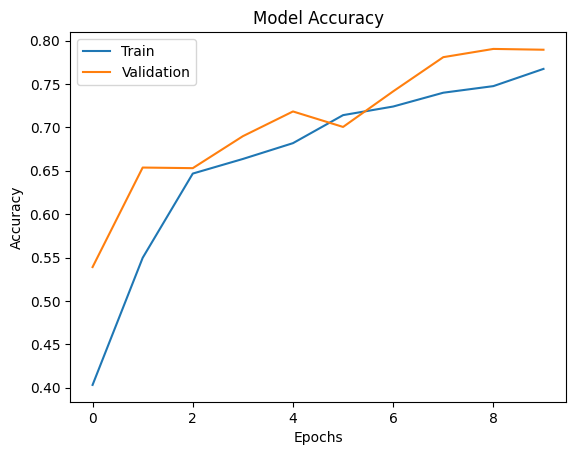

In [12]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['Train','Validation'])
plt.show

1/1 [==============================] - 0s 490ms/step
BO CONG ANH


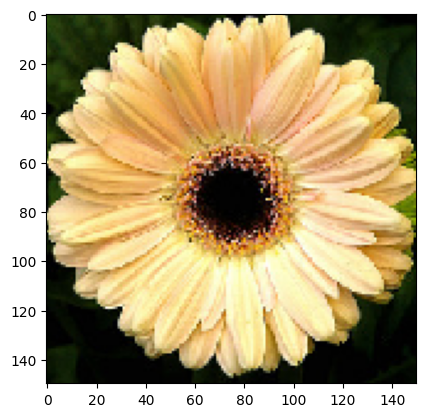

1/1 [==============================] - 0s 18ms/step
HOA CUC


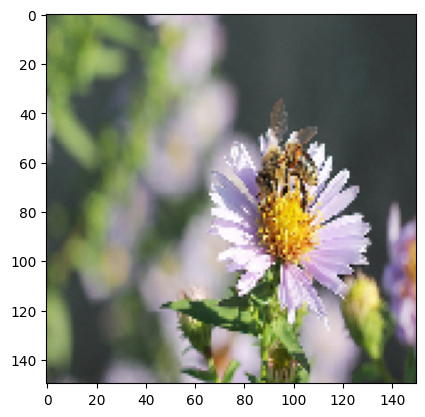

1/1 [==============================] - 0s 59ms/step
BO CONG ANH


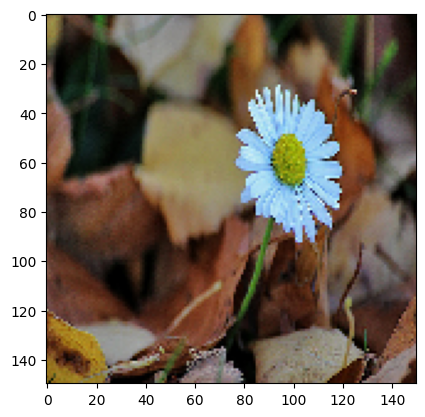

1/1 [==============================] - 0s 27ms/step
BO CONG ANH


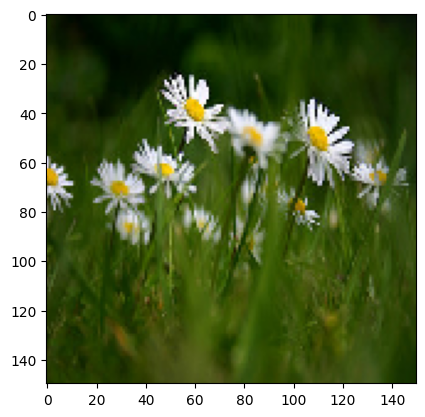

1/1 [==============================] - 0s 105ms/step
BO CONG ANH


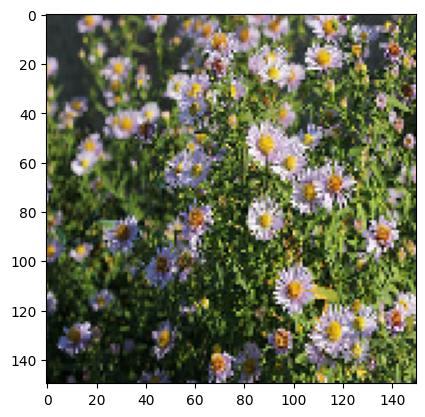

1/1 [==============================] - 0s 18ms/step
BO CONG ANH


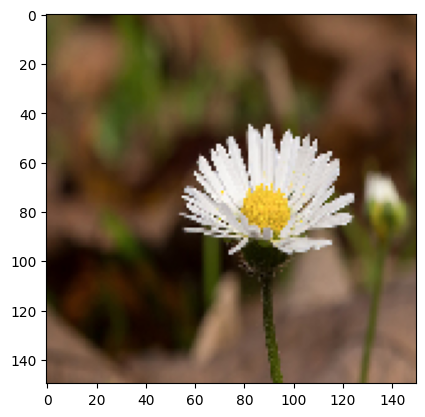

1/1 [==============================] - 0s 29ms/step
BO CONG ANH


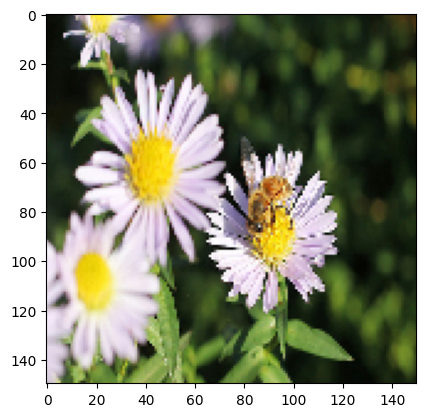

1/1 [==============================] - 0s 38ms/step
HOA CUC


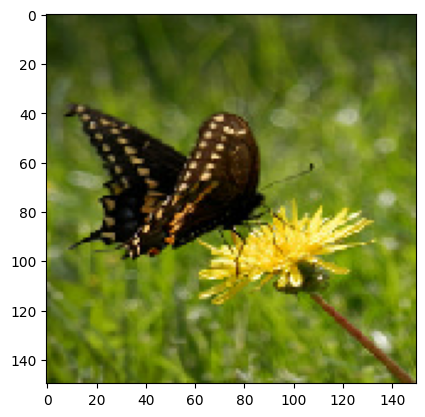

1/1 [==============================] - 0s 30ms/step
HOA CUC


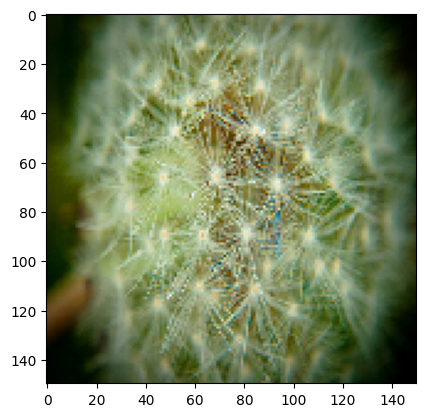

1/1 [==============================] - 0s 29ms/step
HOA CUC


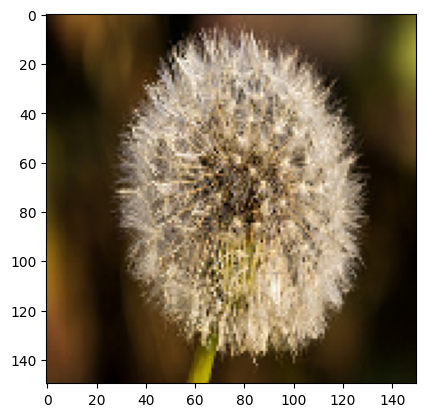

1/1 [==============================] - 0s 26ms/step
HOA CUC


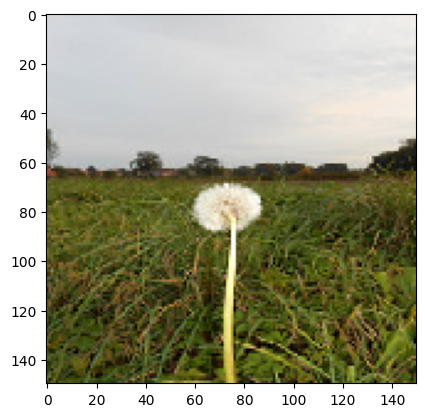

1/1 [==============================] - 0s 46ms/step
HOA CUC


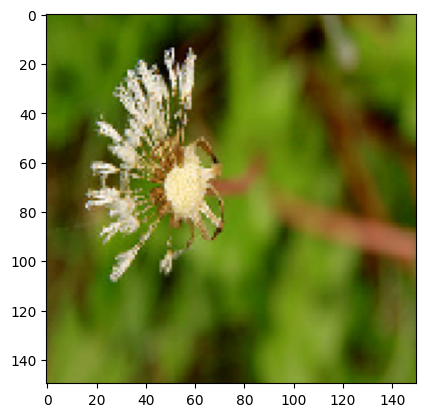

1/1 [==============================] - 0s 21ms/step
HOA CUC


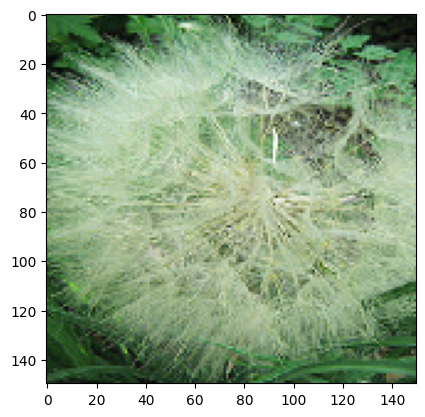

1/1 [==============================] - 0s 18ms/step
HOA CUC


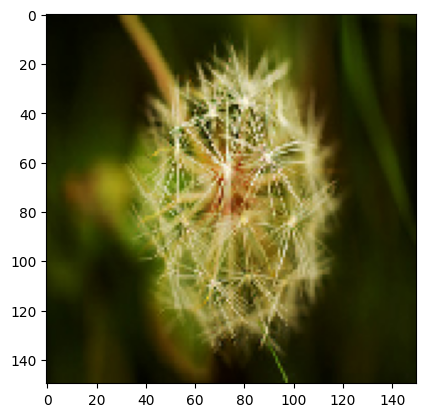

1/1 [==============================] - 0s 20ms/step
HOA CUC


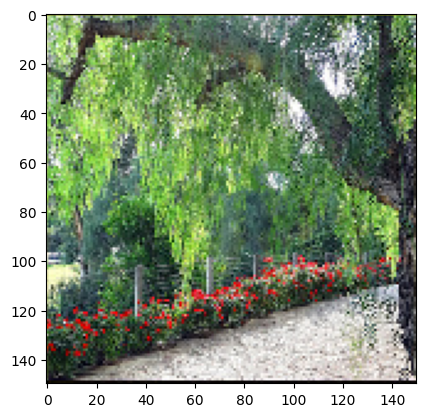

1/1 [==============================] - 0s 26ms/step
HOA HONG


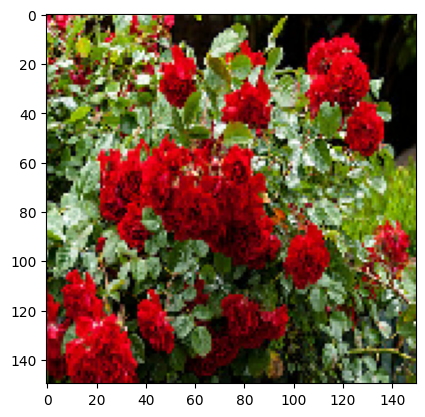

1/1 [==============================] - 0s 20ms/step
HUONG DUONG


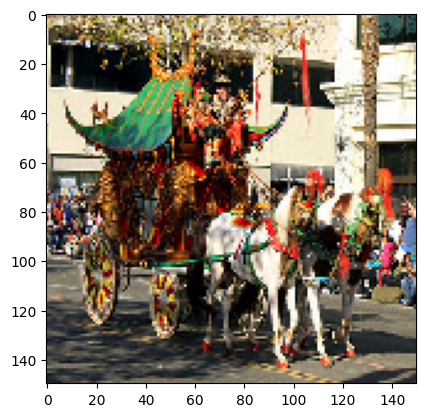

1/1 [==============================] - 0s 21ms/step
HUONG DUONG


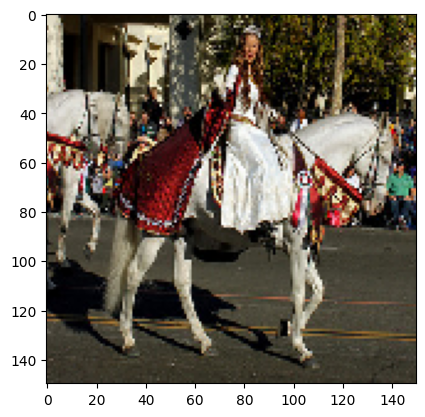

1/1 [==============================] - 0s 18ms/step
HUONG DUONG


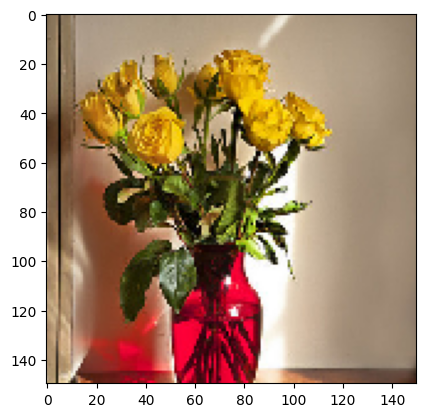

1/1 [==============================] - 0s 21ms/step
HUONG DUONG


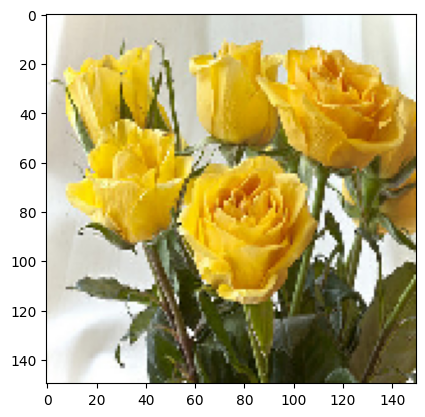

1/1 [==============================] - 0s 18ms/step
HOA HONG


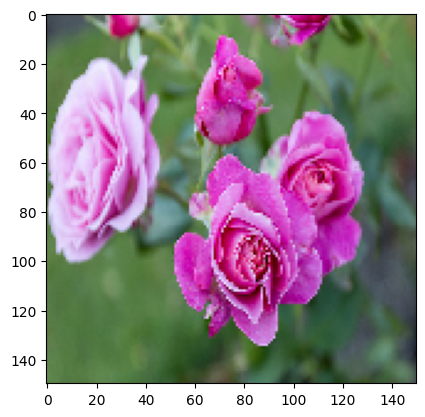

1/1 [==============================] - 0s 21ms/step
HOA HONG


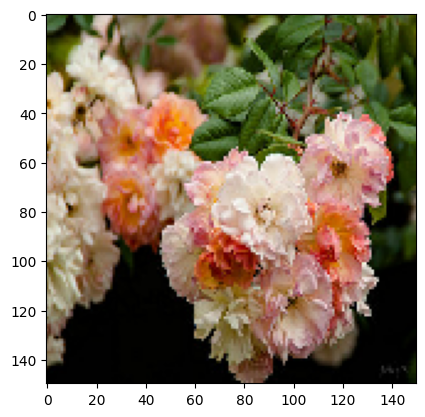

1/1 [==============================] - 0s 19ms/step
HOA HONG


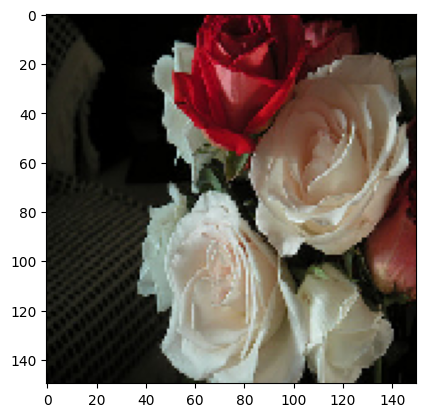

1/1 [==============================] - 0s 18ms/step
HOA CUC


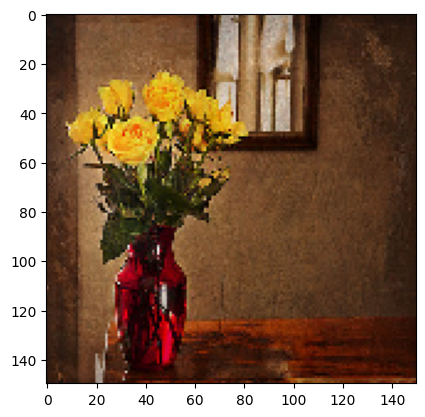

1/1 [==============================] - 0s 20ms/step
HOA HONG


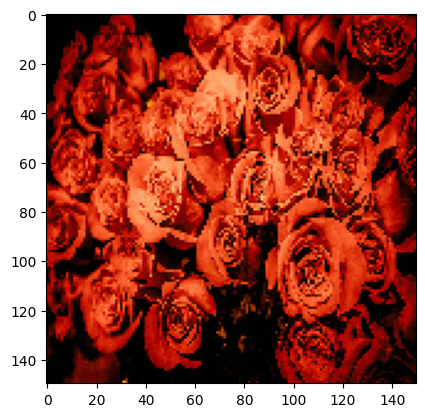

1/1 [==============================] - 0s 23ms/step
HUONG DUONG


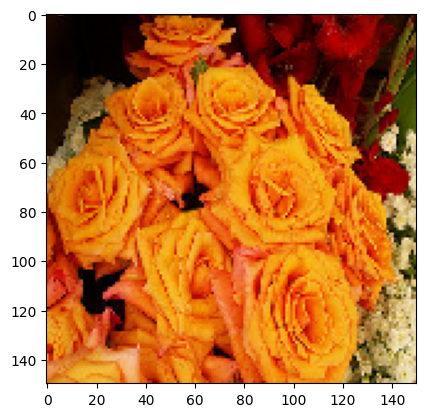

1/1 [==============================] - 0s 29ms/step
HOA HONG


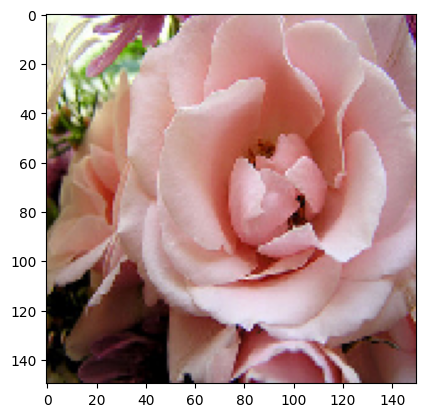

1/1 [==============================] - 0s 31ms/step
HOA HONG


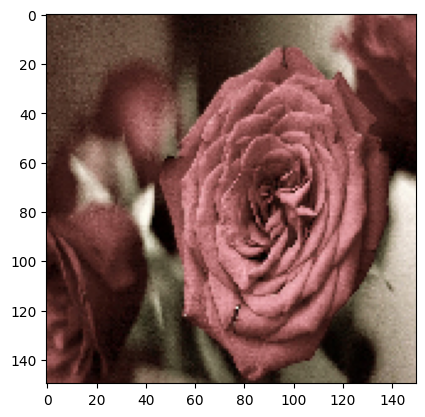

1/1 [==============================] - 0s 33ms/step
HOA HONG


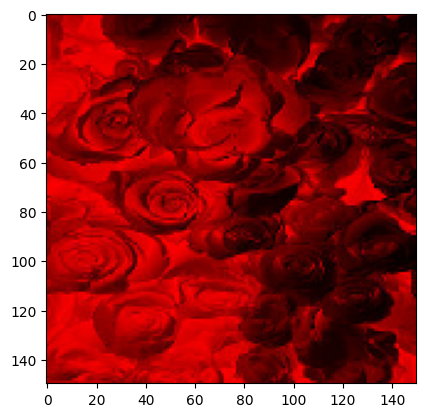

1/1 [==============================] - 0s 29ms/step
HUONG DUONG


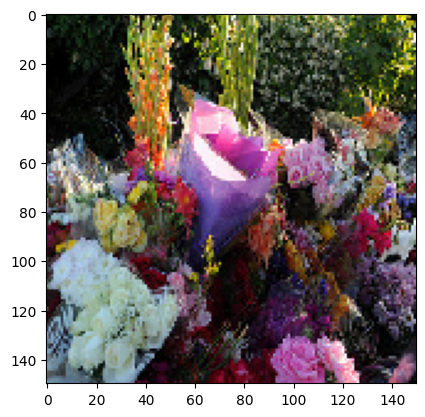

1/1 [==============================] - 0s 28ms/step
TULIP


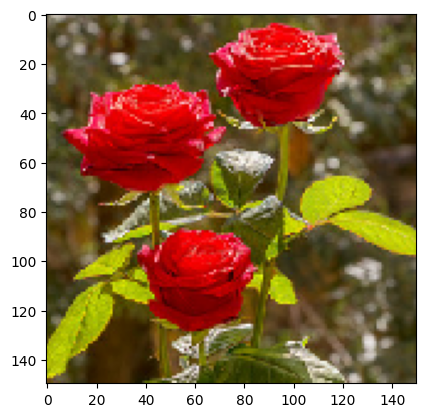

1/1 [==============================] - 0s 26ms/step
HUONG DUONG


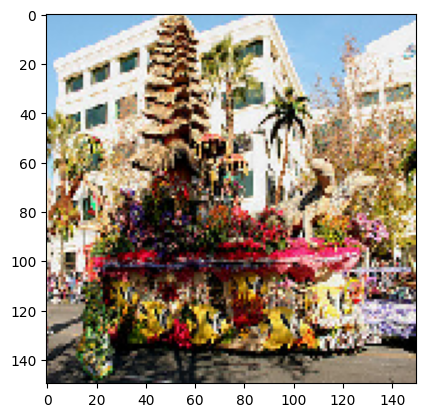

1/1 [==============================] - 0s 43ms/step
BO CONG ANH


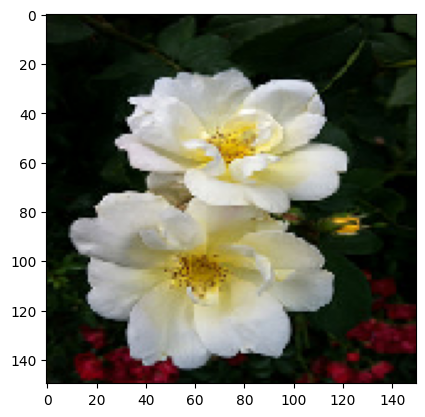

1/1 [==============================] - 0s 26ms/step
HOA HONG


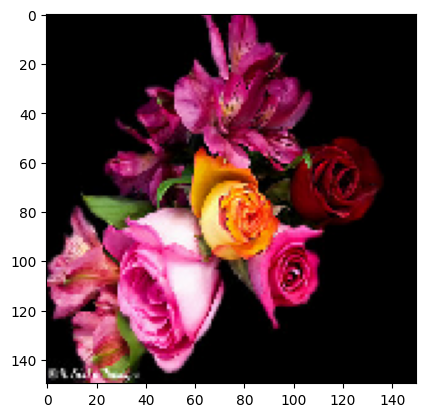

1/1 [==============================] - 0s 22ms/step
HOA HONG


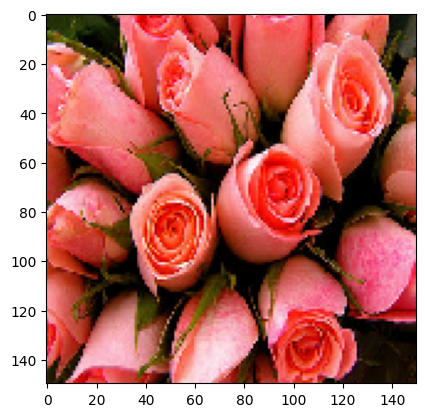

1/1 [==============================] - 0s 21ms/step
HUONG DUONG


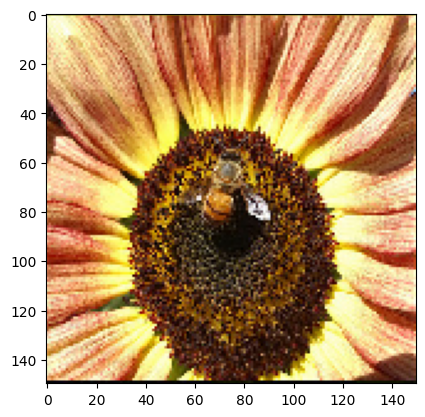

1/1 [==============================] - 0s 19ms/step
HUONG DUONG


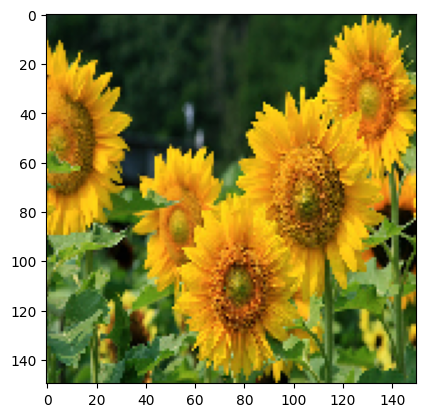

1/1 [==============================] - 0s 18ms/step
HUONG DUONG


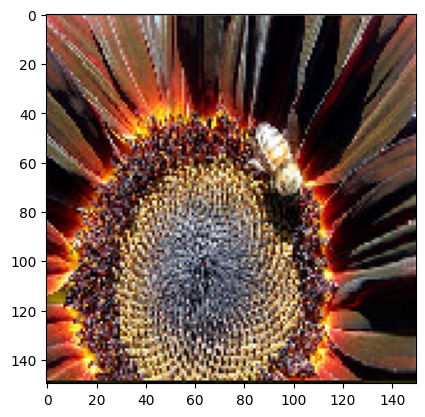

1/1 [==============================] - 0s 20ms/step
HUONG DUONG


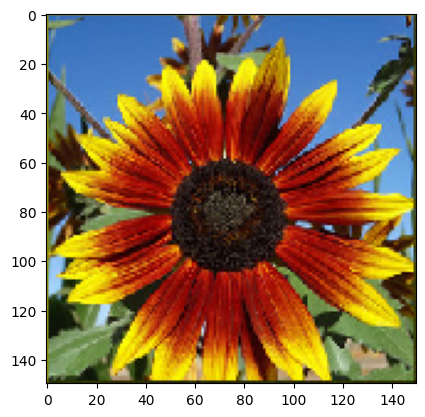

1/1 [==============================] - 0s 20ms/step
HUONG DUONG


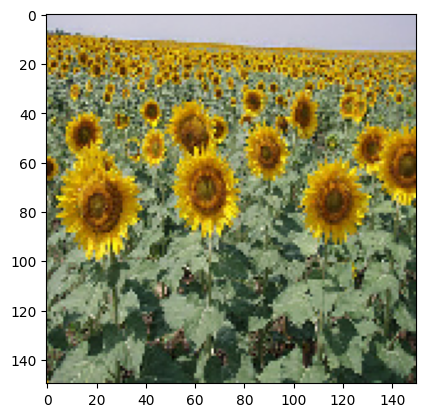

1/1 [==============================] - 0s 21ms/step
HUONG DUONG


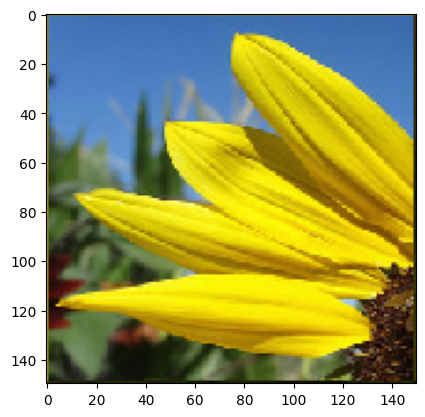

1/1 [==============================] - 0s 27ms/step
HUONG DUONG


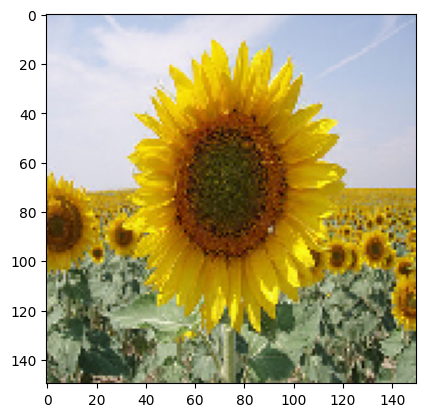

1/1 [==============================] - 0s 18ms/step
HUONG DUONG


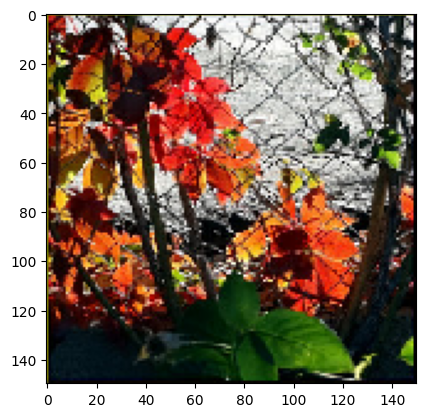

1/1 [==============================] - 0s 21ms/step
TULIP


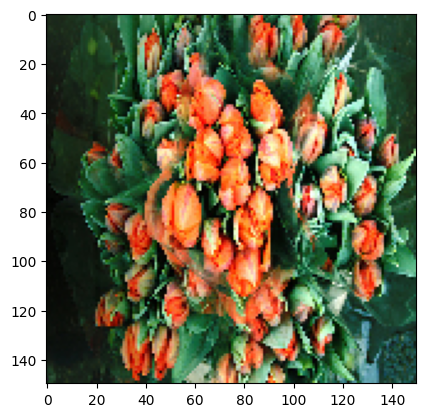

1/1 [==============================] - 0s 30ms/step
TULIP


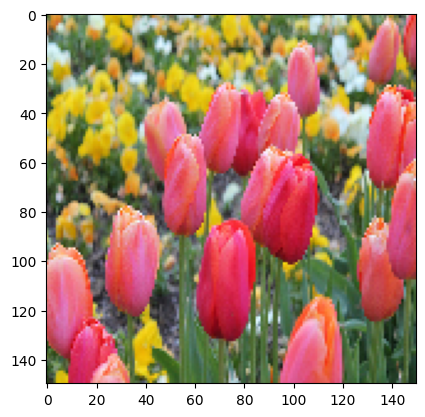

1/1 [==============================] - 0s 29ms/step
BO CONG ANH


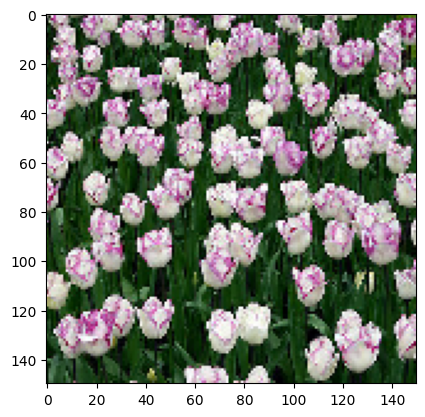

1/1 [==============================] - 0s 29ms/step
HUONG DUONG


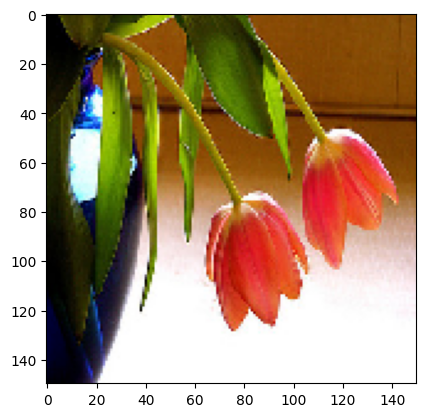

1/1 [==============================] - 0s 25ms/step
TULIP


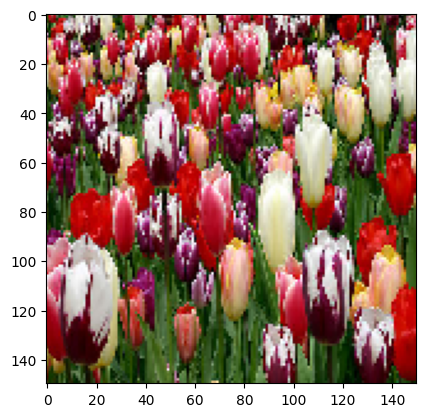

1/1 [==============================] - 0s 30ms/step
TULIP


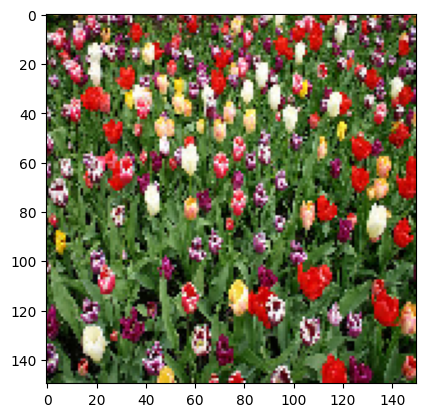

1/1 [==============================] - 0s 26ms/step
TULIP


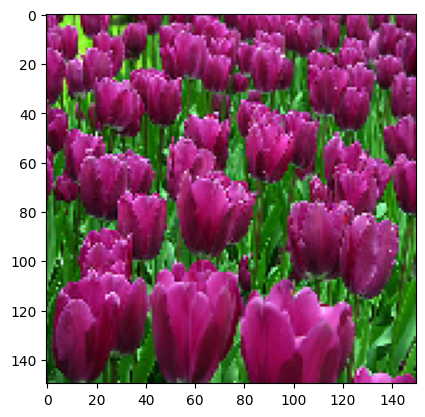

In [14]:
test="/content/drive/MyDrive/flowers/Test"
for i in os.listdir(test):
  img=load_img(test+'/'+i,target_size=(150,150))
  plt.imshow(img)
  img=img_to_array(img)
  img=img.astype('float32')
  img=img/255
  img=np.expand_dims(img,axis=0)
  result=(model_1.predict(img).argmax())
  class_name=['HOA CUC','BO CONG ANH','HOA HONG','HUONG DUONG','TULIP']
  print(class_name[result])
  plt.show()